# Imports

In [33]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image
import random

# Model Settings

In [34]:
# -------- Model Settings ---------

workers = 0       # Number of workers for dataloader
batch_size = 128  # Batch size during training
img_size = 256    # Spatial size of training images. All images will be resized to this
nz = 100          # Size of z latent vector (i.e. size of generator input)
ngf = 64          # Size of feature maps in generator
ndf = 64          # Size of feature maps in discriminator
nc = 3            # Number of channels in the training images. For color images this is 3
num_epochs = 2000 # Number of training epochs
lr = 0.0002       # Learning rate for optimizers
beta1 = 0.5       # Beta1 hyperparameter for Adam optimizers
ngpu = 1          # Number of GPUs available. Use 0 for CPU mode.
print_freq = 5    # print fequency
print_n = 5       # Number of examples to print
use_seed = True   # Use seed for random number generation
seed = 42         # Seed for random number generation
colab = False     # If running on Google Colab (different data path)

In [35]:
if(not use_seed):
    seed = random.randint(1, 10000)

print("Using Seed: ", seed)
random.seed(seed)
torch.manual_seed(seed)
torch.use_deterministic_algorithms(True)

Using Seed:  42


# Data Import

In [36]:
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [
            os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))
        ]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")  # Ensure the image is in RGB format
        if self.transform:
            image = self.transform(image)
        return image

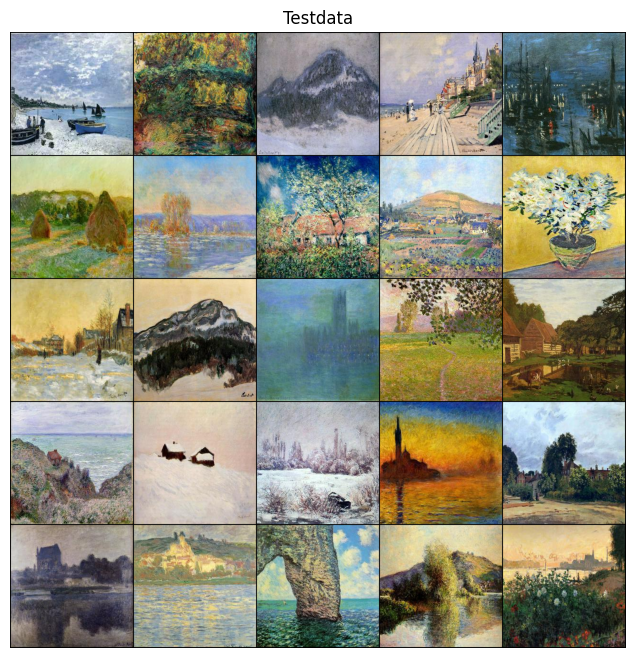

In [37]:
# Root directory for dataset
if(colab):
    dataroot = "/content/drive/MyDrive/Colab Notebooks/Datasets/monet/monet_jpg"
else:
    # You have to change it if you aren't me
    dataroot = "C:/Users/chris/Desktop/NTNU Ting/7. Semester (Kina)/80240793---Final-Project/data/monet_jpg"

# Define image transformations
# We resize the image to img_size x img_size and normalize the pixel values to be between -1 and 1
transform = transforms.Compose([
    transforms.Resize(img_size),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Create the dataset and feed it to the dataloader
dataset = CustomImageDataset(root_dir=dataroot, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

# If we have a GPU available, we'll use it, if not we'll use the CPU
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some monet paintings
test_data = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Testdata")
plt.imshow(np.transpose(
    vutils.make_grid(test_data.to(device)[:25], nrow=5, padding=2, normalize=True).cpu(),
    (1, 2, 0)
))
plt.show()


# Model Setup

In [38]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [39]:
# NOTE: The State sizes noted, assume no change in the input size 
#       They only exist so we could over the size of the images

class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Start with atent space Z of size (100, 1, 1)
            nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # State size: (1024, 4, 4)
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # State size: (512, 8, 8)
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # State size: (256, 16, 16)
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # State size: (128, 32, 32)
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # State size: (64, 64, 64)
            nn.ConvTranspose2d(ngf, ngf // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf // 2),
            nn.ReLU(True),
            # State size: (32, 128, 128)
            nn.ConvTranspose2d(ngf // 2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output: (3, 256, 256)
        )

    def forward(self, input):
        return self.main(input)

In [40]:
# NOTE: The State sizes noted, assume no change in the input size 
#       They only exist so we could over the size of the images

class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Input is nc with size (3, 256, 256)
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (64, 128, 128)
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (128, 64, 64)
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (256, 32, 32)
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (512, 16, 16)
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (1024, 8, 8)
            nn.Conv2d(ndf * 16, ndf * 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 32),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (2048, 4, 4)
            nn.Conv2d(ndf * 32, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: (1) Binary classification
        )

    def forward(self, input):
        return self.main(input)

In [41]:
# We Create the generator and discriminator
netG = Generator(ngpu, nz, ngf, nc).to(device)
netD = Discriminator(ngpu, nc, ndf).to(device)

# If we have multiple GPUs, we run it in paralell
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    netD = nn.DataParallel(netD, list(range(ngpu)))

# We randomly initialize the weights from a normal distribution with mean 0 and standard deviation 0.02
# This is based on the DCGAN paper by Radford et al.
netG.apply(weights_init)
netD.apply(weights_init)

# Print the models
print(netG)
print(netD)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchN

In [42]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(25, nz, 1, 1, device=device)

# Add labels for the images (real or fake)
# We use soft labels to make the discriminator less likely to dominate the generator
real_label = 0.95
fake_label = 0.05

# Setup Adam optimizers for generator and discriminator
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training

In [43]:
sample_image = dataset[0]
print(f"Sample image shape: {sample_image.shape}")

# Test a single batch
batch = next(iter(dataloader))
print(f"Batch shape: {batch.shape}")

Sample image shape: torch.Size([3, 256, 256])
Batch shape: torch.Size([128, 3, 256, 256])


In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print(f"Starting Training Loop... \nTotal epochs: {num_epochs}, dataset size: {len(dataloader)}")
print("----------------------------------------------")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        # -------------------------------------------------------------------
        # Train the discriminator
        # We want to maximize log(D(x)) + log(1 - D(G(z)))
        # -------------------------------------------------------------------
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        output_real = output[:print_n].tolist()

        # -------------------------------------------------------------------
        # Train the Generator
        # We want to maximize log(D(G(z)))
        # -------------------------------------------------------------------

        netG.zero_grad()
        label.fill_(real_label)  # Use real label as we try to pass these ass real
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        output_fake = output[:print_n].tolist()

        # Output training stats
        if i % print_freq == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Print discriminator's predictions for 5 real and 5 fake images
            print('D(real):', output_real, '\nD(fake):', output_fake)

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop... 
Total epochs: 2000, dataset size: 3
----------------------------------------------
[0/2000][0/3]	Loss_D: 3.0525	Loss_G: 1.9941	D(x): 0.1759	D(G(z)): 0.1409 / 1.0000
D(real): [0.24419118463993073, 0.003714971709996462, 0.11224954575300217, 0.09317685663700104, 0.017650315538048744] 
D(fake): [0.9999998807907104, 0.9999998807907104, 1.0, 1.0, 1.0]


# Print Results

NameError: name 'G_losses' is not defined

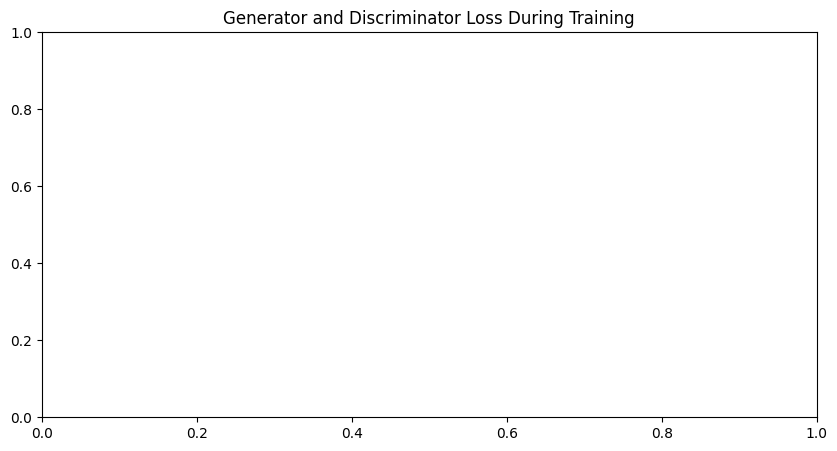

In [ ]:
# ----- We plot the model Losses -----
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discrimnator")
plt.xlabel("Iteration")
plt.ylabel("Model Loss")
plt.legend()
plt.show()

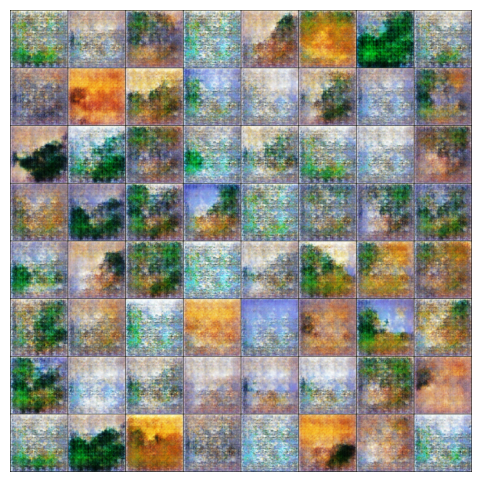

In [ ]:
# We create an animation showing our generators progression
# This can be used to indicate when the model has converged
fig = plt.figure(figsize=(6,6))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())